## Оглавление

**Рынок заведений общественного питания Москвы**

**Цель исследования:**
- Проанализировать список заведений и определить тенденции локального рынка общепита
- Определить удачные варианты выбора района и категории заведения для открытия нового заведения
- Отдельно проверить заведения в категории кофеен

**Задачи исследования:**
- Выяснить, какие категории заведений встречаются в Москве
- Узнать, какое у заведений среднее количество посадочных мест
- Посмотреть на распределение заведений по улицам
- Изучить средние цены заказов по районам
- Определить самые популярные сети
- Посмотреть на различия между сетевыми и одиночными заведениями


**Описание данных:**


- name — название заведения
- address — адрес заведения
- category — категория заведения
- hours — информация о днях и часах работы
- lat — широта географической точки, в которой находится заведение
- lng — долгота географической точки, в которой находится заведение
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0)
- price — категория цен в заведении
- avg_bill — средняя стоимость заказа в виде диапазона цен
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill
- chain — число (0 или 1), которое показывает, является ли заведение сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

**Структура проекта**

- [Общая информация](#Общая-информация)
---
- [Предобработка данных](#Предобработка-данных)
---
- [Анализ данных](#Анализ-данных)
    - [Категории](#Категории)
    - [Посадочные места](#Посадочные-места)
    - [Сетевые и несетевые заведения](#Сетевые-и-несетевые-заведения)
    - [Категории сетевых заведений](#Категории-сетевых-заведений)
    - [Самые популярные сети](#Самые-популярные-сети)
    - [Административные районы](#Административные-районы)
    - [Средние рейтинги](#Средние-рейтинги)
    - [Рейтинг по районам](#Рейтинг-по-районам)
    - [Все заведения на карте](#Все-заведения-на-карте)
    - [Топ 15 улиц](#Топ-15-улиц)
    - [Улицы с одним объектом](#Улицы-с-одним-объектом)
    - [Средний чек по району](#Средний-чек-по-району)
    - [Вывод](#Вывод)
---
- [Детализация исследования](#Детализация-исследования)
    - [Всего кофеен](#Всего-кофеен)
    - [Круглосуточные кофейни](#Круглосуточные-кофейни)
    - [Средние рейтинги кофеен](#Средние-рейтинги-кофеен)
    - [Стоимость чашки кофе](#Стоимость-чашки-кофе)
    - [Крупные конкуренты](#Крупные-конкуренты)
    - [Цена чашки кофе для нового заведения](#Цена-чашки-кофе-для-нового-заведения)
    - [Вывод](#Вывод)
---
- [Итог](#Итог)
---
- [Презентация](#Презентация)

## Общая информация

In [1]:
import pandas as pd

import matplotlib.pyplot as plt

import seaborn as sns

import plotly.express as px
from plotly import graph_objects as go

import json

from folium import Map, Choropleth, Marker, Element
from folium.plugins import MarkerCluster

In [2]:
try:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
except:
    data = pd.read_csv('https://disk.yandex.ru/d/Ayav27Q1J2BbVA')

In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


Всего представлено 8406 заведений


**Данные:**

Итого, у нас на руках богатый датафрейм. В нем почти 8.5 тысяч заведений, для каждого заведения довольно много разнообразных данных, что не может не радовать. Но обращает на себя внимание то, что в данных из-за специфи сбора некоторых категорий оных присутствует большое количество пропусков, но детально этот вопрос изучим дальше. В целом, можно заключить, что данные объемные и как будто бы достаточно хорошего качества.

В плане самих данных есть любопытные прецеденты, вроде максимальной цены чашки кофе в районе 1600р, а также заведения со средним счетом в 35т.р. Но считать это некорректными данными будет неправильно, т.к. в единичных кейсах возможны и подобны заведения.

## Предобработка данных

In [6]:
# полные дубликаты 
print(data.duplicated().sum())
data[['name', 'address']].duplicated().sum()

0


0

In [7]:
# нашлись частичные дубликаты, их всего четыре, можно смело срезать
data[data[['name', 'address']].applymap(lambda s: s.lower()).duplicated()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,Кафе,кафе,"Москва, парк Ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,Раковарня Клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,Хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [8]:
data = data.drop((data[data[['name', 'address']].applymap(lambda s: s.lower()).duplicated()]).index)
data.shape

(8402, 14)

In [9]:
# пропуски
data.isna().sum().sort_values(ascending=False)

middle_coffee_cup    7867
middle_avg_bill      5253
price                5087
avg_bill             4586
seats                3610
hours                 535
name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
dtype: int64

In [10]:
# сделаем названия улиц из адреса
data['street'] = data['address'].str.split(',', n=2, expand=True)[1]

In [11]:
data['street'].head()

0               улица Дыбенко
1               улица Дыбенко
2          Клязьминская улица
3     улица Маршала Федоренко
4         Правобережная улица
Name: street, dtype: object

In [12]:
# заведения работающие 24/7
data['is_24/7'] = data['hours'].str.contains("круглосуточно")
#data[data['hours'].str.contains("круглосуточно")==True].head()

In [13]:
# проверка, что в столбце столько же заведений как и строк с подстрокой
data['is_24/7'].sum() == data[data['hours'].str.contains("круглосуточно")==True].shape[0]

True

**Предобработка:**

В данных действительно оказалось большое количество пропусков и по всей видимости придется оставить их нетронутыми, чтобы не испортить качество выборки. Это не фатально, т.к. пропуски оказались в тех категориях, которые получится заменить аналогами при агрегировании. Полных дубликатов в данных не оказалось, но оказалось 4 частичных, от которых мы избавились

После предобработки в данных появилось несколько новых столбцов с которыми можно будет упросить работу в дальнейшем.

## Анализ данных

### Категории

In [14]:
sns.set_style("whitegrid")
sns.set_context("talk")
sns.set(rc={'figure.figsize':(15,10)})

In [15]:
cats = data.groupby('category').agg({'name':'count'})\
    .reset_index().sort_values('name', ascending=False)

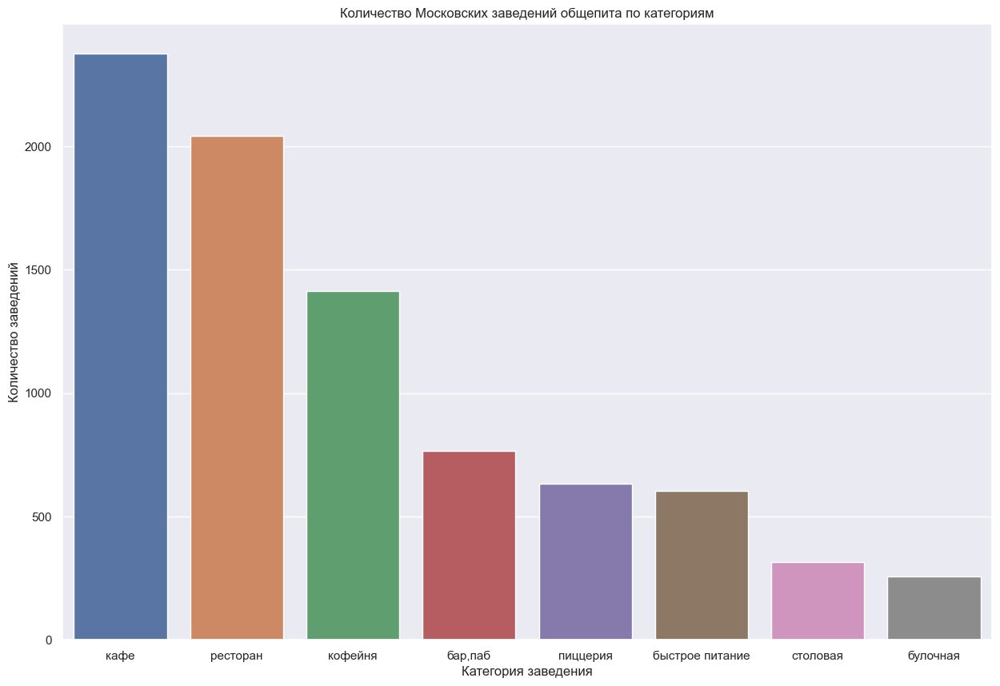

In [16]:
sns.barplot(x=cats['category'], y=cats['name']).set(
    title='Количество Московских заведений общепита по категориям', 
    xlabel='Категория заведения', ylabel='Количество заведений');

**Категории заведений**

Лидерами среди москвы стали кафе и рестораны, на них двоих приходится примерно половина всех данных. Следом, с заметным отставанием идут кофейни, а дальше относительно равномерно распределились все остальные категории заведений. 

Булочных и столовых оказалось совсем мало, лишь по несколько сотен заведений на весь город, видимо они не пользуются высокой популярностью

### Посадочные места

In [17]:
seats_by_cats = data.groupby('category').agg({'seats':'median'})\
    .reset_index().sort_values('seats', ascending=False)

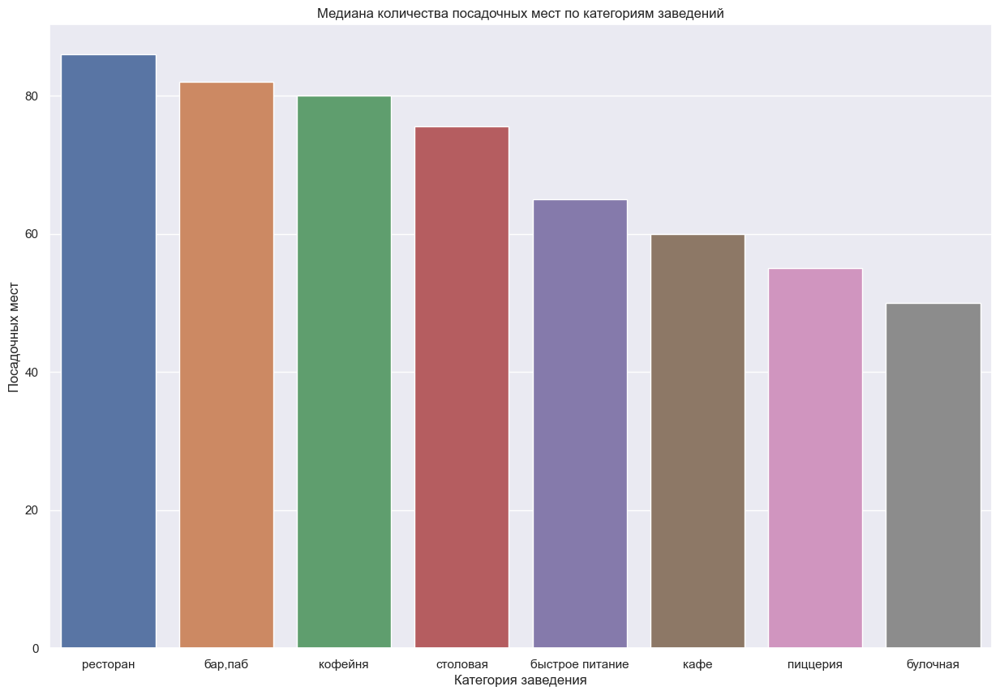

In [18]:
sns.barplot(x=seats_by_cats['category'], y=seats_by_cats['seats']).set(
    title='Медиана количества посадочных мест по категориям заведений', 
    xlabel='Категория заведения', ylabel='Посадочных мест');


**Посадочные места:**

В целом, заведения распределились ожидаемо. Медианное количество между разными категориями заведений отличается, но отличия не сильно бросаются в глаза. Наибольшее число мест в среднем ожидаемо находится в ресторанах. 
Наименьшее количество мест оказалось в булочных и пиццериях.

### Сетевые и несетевые заведения

In [19]:
chains = data.groupby('chain').agg({'name':'count'}).reset_index()

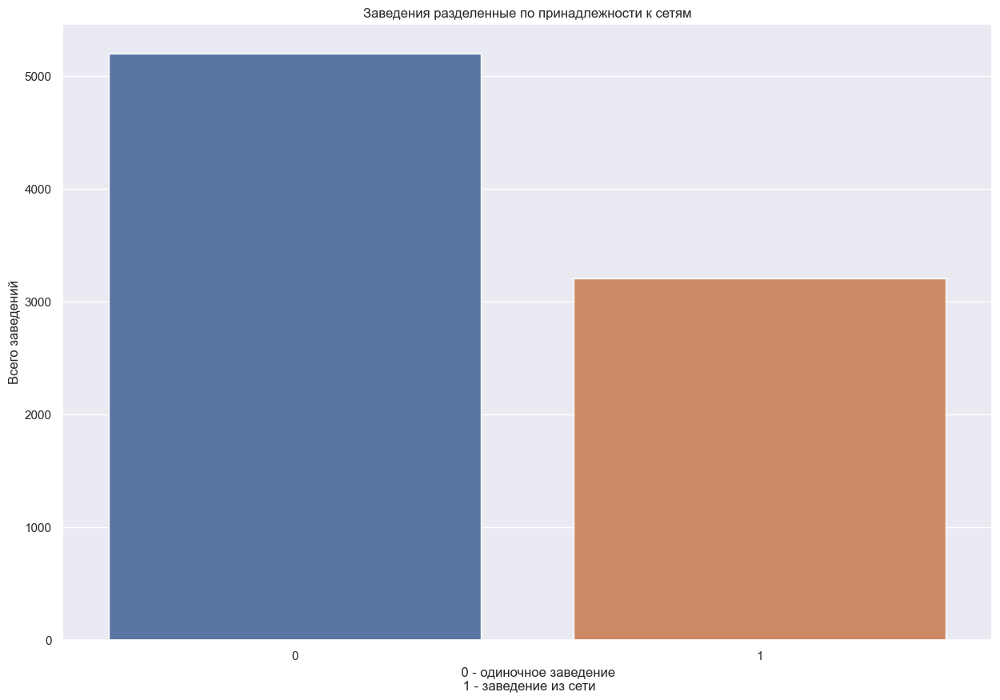

In [20]:
sns.barplot(x=chains['chain'], y=chains['name']).set(
    title='Заведения разделенные по принадлежности к сетям', 
    xlabel='       0 - одиночное заведение \n 1 - заведение из сети', 
    ylabel='Всего заведений');


**Сетевые/не сетевые заведения:**

Чуть более трети заведений оказались сетевыми. Довольно высокий показатель, с учетом общего числа заведений в данных. Но в то же время, очень существенная часть заведений оказалась одиночными. Т.е. выживать на Московском рынке удается обеим категориям вполне успешно, судя по всему.

### Категории сетевых заведений

In [21]:
cats_by_chains = data.groupby(
    ['chain', 'category']).agg({'name':'count'}).reset_index().sort_values('name')

cats_by_chains = cats_by_chains.join(data.groupby('category').agg(
    {'name':'count'}).rename(columns={'name':"total"}), on='category')
cats_by_chains['percentage'] = (cats_by_chains['name'] /  cats_by_chains['total'] * 100).round(1)
#cats_by_chains

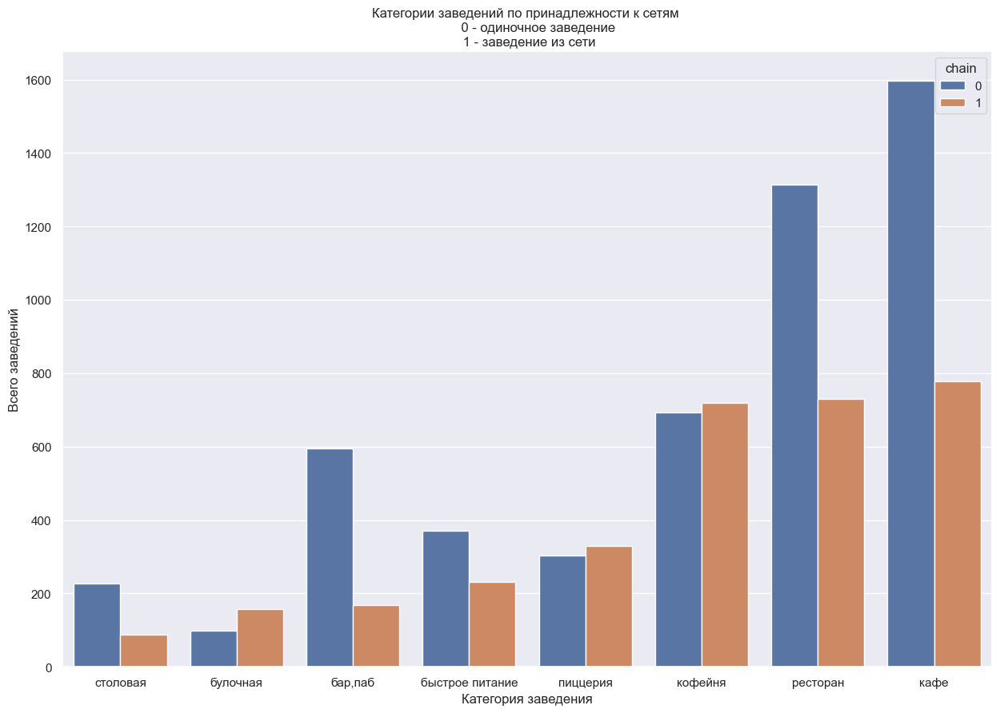

In [22]:
sns.barplot(data=cats_by_chains, x="category", y="name", hue="chain").set(
    title=('Категории заведений по принадлежности к сетям \n' + 
           '       0 - одиночное заведение \n 1 - заведение из сети'), 
    xlabel='Категория заведения', 
    ylabel='Всего заведений');


In [23]:
fig = px.histogram(cats_by_chains, x="category", y="percentage", color='chain')
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.update_layout(
    title='Категории заведений по принадлежности к сетям (доли)',
    xaxis_title='Категория заведения',
    yaxis_title="Доли")
fig.show()

**Категории заведений по принадлежности к сетям:**

При детальном разборе по категориям становится заметны очень сильные различия от категории к категории. Если для некоторых категорий, таких как: столовые, бары/пабы, быстрое питании, рестораны и кафе более характерны одиночные заведения, то для остальных пропорции сместились и находятся на уровне примерно 50/50 между сетевыми и несетевыми заведениями. 

Отдельно любопытно выделилась категория баров с пабами, где пропорция сетевых заведений к одиночным оказалось заметно ниже любой другой. Среди булочных результат противоположный, хоть и разница в пропорциях гораздо меньше.

### Самые популярные сети

In [24]:
top_15 = data.groupby('name').agg(
    {'chain':'sum'}).reset_index().sort_values('chain', ascending=False).head(15).join(data['category'], how='left')
#top_15

In [25]:
fig = px.histogram(top_15, x="name", y="chain", color='category')
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.update_layout(
    title="Топ 15 сетей по количеству точек",
    xaxis_title="Название сети",
    yaxis_title="Число заведений")
fig.show()

In [26]:

print('"Шоколадница" представлена в данных следующими категориями: {}'.format(
    list(data.query('name == "Шоколадница"')['category'].unique())))

"Шоколадница" представлена в данных следующими категориями: ['кофейня', 'кафе']


In [27]:
print('"Теремок" представлен в данных следующими категориями: {}'.format(
    list(data.query('name == "Теремок"')['category'].unique())))

"Теремок" представлен в данных следующими категориями: ['ресторан', 'быстрое питание']


**Самые популярные сети**

Обращает на себя внимание, что в рамках одной сети есть порой заведения в разных категориях, вроде "Шоколадницы". Но обычно в рамках одной сети все же заведения одного профиля, так что особого внимания этому уделять не стоит.

Доминирующей категорий стали кафе, из 15-и самых крупных сетей треть мест оказалась за ними, на втором месте идут кофейне с четырьмя сетями, а на третьем рестораны с тремя. За остальными категориями в топе оказалось лишь по одной сети, возможно для ним менее свойственна подобная специфика.
А самой крупной по числу заведений сетью в Москве стала Шоколадница

### Административные районы

In [28]:
cats_by_distr = data.groupby(['district', 'category']).agg({'name':'count'}).reset_index().sort_values(['category', 'name'])
#cats_by_distr.head()

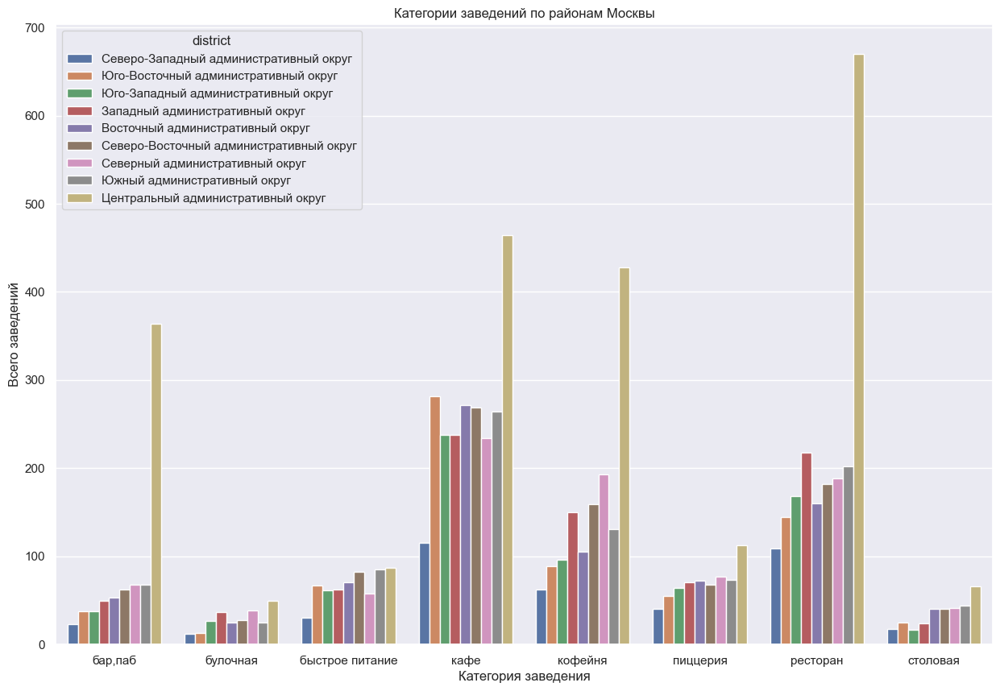

In [29]:
sns.barplot(data=cats_by_distr, x="category", y="name", hue="district").set(
    title=('Категории заведений по районам Москвы'), 
    xlabel='Категория заведения', 
    ylabel='Всего заведений');

**Категории заведений по районам:**

В целом, распределение повторяет картину заполненности районов заведениями в принципе. т.е. если пропорции общего количества заведений в районе отражаются и тут. Но есть некоторые исключения. Во-первых, сильно выделяется Центральный АО. Да, там больше всего заведений, но пропорции в некоторых категориях крайне выделяются на общей массе. Если столовых или заведений быстрого питания там больше незначительно на фоне остальных, то ресторанов больше более чем в 3 раза, а баров в ~4. Явно, район очень специфический и потребует особенного внимания, если мы захотим выбрать его. Также обращает на себя внимание категория кафе, где большинство районов распределились очень близко друг к другу. Вероятно, сама категория населения предполагает то, что клиенты не ездят туда издалека и ими можно равномерно занимать площади, конкурируя лишь с теми кафе, что находятся в непосредственной близости.

### Средние рейтинги

In [30]:
ratings_by_cat  = data.groupby('category').agg({'rating':'mean'}).reset_index().sort_values('rating')
#ratings_by_cat

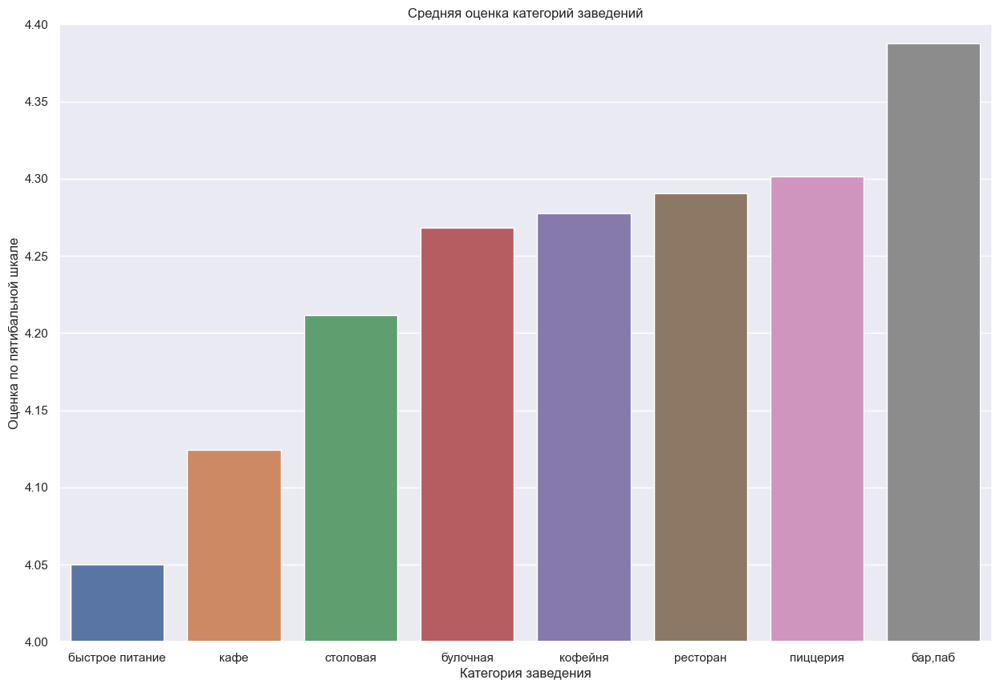

In [31]:
sns.barplot(data=ratings_by_cat, x="category", y="rating").set(
    title=('Средняя оценка категорий заведений'), 
    xlabel='Категория заведения', 
    ylabel='Оценка по пятибальной шкале', ylim=(4, 4.4));

**Рейтинги по категориям:**

Казалось бы, при ожидаемых +- равных рейтингах между категориями, реальное распределение сильно отличилось. Бары и пабы стали доминантой со средним рейтингом почти 4.4 балла, в то же время заведения быстрого питания и кафе оказались заметно ниже всех остальных. И если от быстрого питания этого ожидать в целом можно было, то показатели кафе действительно удивляют. 

Думаю, если у нас есть желание качественно выделять на фоне конкурентов - то выбор менее рейтинговых конкурентов не самый худший способ упростить себе жизнь. Посему кафе выглядит как очень интересная категория. Будучи одновременно и востребованной, а также с достаточно низкими средними рейтингами заведений. Доля быстрого питания и столовых на рынке слишком низка, чтобы в первую очередь обращать внимание на них. Но своя ниша у них тоже есть, как и свой потребитель, пусть и не слишком массовый.

### Рейтинг по районам

In [32]:
try:
    state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
except:
    state_geo = 'https://disk.yandex.ru/d/3cWt7t_ccNwfyg'

In [33]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.7,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)
loc = 'Средний рейтинг заведегний по районам'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc)
m.get_root().html.add_child(Element(title_html))

m

**Рейтинги по районам:**

В среднем, для большинства районов рейтинги заведений ожидаемо близки и находятся в районе 4.2 баллов. Выделяется Восточный АО АО, где на удивление средний рейтинг заметно ниже остальных районов и находится где-то на отметке 3.4 баллов. Также удивительно видеть Северо-Восточный АО, у которого рейтинг уже выше всех остальных и вплотную приближается к пятерке. 

### Все заведения на карте

In [34]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)
loc = 'Все Московские заведениях в виде кластеров'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc)
m.get_root().html.add_child(Element(title_html))
m

### Топ 15 улиц

In [54]:
# топ 15 улиц
t15_streets = data.groupby('street').agg({'name':'count'}).sort_values('name', ascending=False).reset_index().head(15)['street']

t15_streets_cats = data.query('street in @t15_streets').groupby(['street', 'category'])\
    .agg({'name':'count'}).reset_index()\
    .sort_values(['street', 'name'], ascending=False)

#t15_streets_cats.head()

In [37]:
fig = px.bar(t15_streets_cats, x='street', y='name', color='category')
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.update_layout(
    title='Топ 15 самых "насыщенных" заведениями улиц',
    xaxis_title='Улица',
    yaxis_title="Число заведений")
fig.show()

**Самые заполненные улицы:**

По большей части распределение категорий на всех улицах относительно похоже, но в то же время есть некоторые специфические различия. Например, на на некоторых улицах (Ленинский пр., Ленинградский пр. и т.п.) заметно нише число заведений быстрого питания на фоне остальных. Также, выделяется МКАД, на котором доля кафе заметно преобладает на фоне всех остальных заведений, а также относительно очень низка доля ресторанов. Для МКАДА такая ситуация вытекает из того, что сама локация вряд ли будет вызывать желание посетить заведение ресторанного типа, для этого подойдут более спокойные и живописные места. 

А для вышеописанных проспектов можно предположить то, что в силу специфики целевой аудитории ресторанов быстрого питания, которая в основном состоит из молодых людей без личного транспорта, расположение на таких больших загруженных проспектах оказывается просто неудобным для них и трафик естественным образом становится недостаточным. Соответственно, фастфуды в основном выбирают себе локации с высокой пешей проходимостью, а не автомобильной.

### Улицы с одним объектом 

In [38]:
_ = data.groupby('street').agg({'name':'count'}).reset_index().query('name == 1')['street']
# улицы на которых только 1 заведение
one_place_per_street = data.query('street in @_')
#one_place_per_street.head()

In [39]:
fig = px.histogram(one_place_per_street, x="category", y="rating", barmode='group',
             histfunc='count')
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.update_layout(
    title="Число заведений на улицах лишь с одним заведением",
    xaxis_title="Категория заведения",
    yaxis_title="Число заведений")
fig.show()

In [40]:
fig = px.histogram(one_place_per_street, x="category", y="rating", barmode='group',
            histfunc='avg')
fig.update_layout(xaxis = {"categoryorder":"total descending"})

fig.update_layout(
    title="Рейтинги заведений на улицах лишь с одним заведением",
    xaxis_title="Категория заведения",
    yaxis_title="Средний рейтинг", 
    yaxis_range=[4,4.5])

fig.show()

In [41]:
pie_only_one = one_place_per_street.groupby('price').agg({'name':'count'}).reset_index()
pie_all = data.groupby('price').agg({'name':'count'}).reset_index()

In [42]:
fig = px.pie(pie_only_one, values='name', names='price',
             title='Распределений заведений ко категории цен (лишь для улиц с одним заведений)')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [43]:
fig = px.pie(pie_all, values='name', names='price',
             title='Распределений ВСЕХ заведений ко категории цен')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

**Улицы на которых лишь одно заведение**

В отличие от общего распределения, здесь сразу бросается в глаза то, что пропорции количества заведений по категориям заметно поменялись. Рестораны все еще находятся на втором месте, но с гораздо большим отрывом от кафе. Можно предположить, что т.к. ценник в ресторанах заметно выше на фоне кафе - то обычно улицами с одним заведением оказываются места не слишком привлекательные для относительно обеспеченной прослойки населения. Правда, с учетом распределения заведений по категориям цен 
Что также косвенно можно подтвердить распределением категорий цен: для "моно-улиц" наблюдается увеличение доли заведений со средними и низкими ценами, а также уменьшение доли заведений с высокими ценниками.

При этом, рейтинги у заведений на подобных улицах несколько выше средних показателей. Вполне возможно, это вызвано меньшей конкуренцией и тем, что посетители абстрагируются от других соседних заведений при оценке оных. Ведь других заведений в близкой доступности попросту может не быть.

### Средний чек по району

In [44]:
avg_bills = data.query('middle_avg_bill > 0').groupby('district').agg({'middle_avg_bill':'mean'}).reset_index()
#avg_bills

In [45]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=avg_bills,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    legend_name='Средний ценник заказа по районам',
).add_to(m)
loc = 'Средний чек по районам'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc)
m.get_root().html.add_child(Element(title_html))

m

**Средний чек**

Наибольший чек ожидаемо показал Центральный АО, ближе всего к нему подошел Западный АО. В то же время, самые низкие показатели у Северо-Восточного и Юго-Восточного АО. Разница между самыми дорогими и самыми дешевыми районами оказалась очень существенной, между Центральным АО и самыми дешевыми районами разница почти двухкратная. 

### Вывод

- На момент исследования в Москве оказалось суммарно 8406 заведений 
- Самые популярные категории заведений в Москве - кафе и рестораны, следом с небольшим отставанием идут кофейни. Остальный распределились относительно равномерно. Наименьшая популярность у столовых и булочных
- По посадочным местам различия между заведениями довольно малы. Больше всего посадочных мест в среднем у ресторанов, меньше всего у булочных
- Чуть более трети всех заведений москвы являются сетевыми
- Сетевыми заведениями чаще являются пиццерии, булочные и кофейни. Среди остальных категорий заведений более характерны одиночные заведения
- Самая крупная по числу точек московская сеть - Шоколадница
- Распределение категорий заведений по районам в целом выглядит ожидаемо, но обращает на себя внимание Центральный АО, где заведений отдельных категорий(вроде баров/паборв и ресторанов) в разы больше относительно остальных категорий и АО в принципе. Также стоит заметить, что количество кафе приблизительно одинаково высокое во всех районах, за исключением все того же Центрального АО. 
- Между средними рейтингами категорий заведений, на удивление, наблюдаются довольно заметные различия. Наивысшие средние рейтинги у баров/пабов, наименьшие у кафе и фастфудов. 
- В среднем между районами рейтинги заведений отличаются не сильно. Выделяются лишь Восточный АО, где рейтинги заметно ниже остальных районов, а также Северо-Восточный АО, где рейтинги заметно выше остальных.
- В Центральном АО заметно больше заведений относительно остальных районов
- Улица с наибольшим числом заведений - Проспект Мира
- У улиц на которых находится лишь одно заведений есть свой специфика. Там заметно преобладают кафе, а также заведения в среднем более бюджетного уровня на фоне остальных заведений города.
- Наибольший чек среднего заказа в Центральном АО, чуть ниже него Западный АО. Самый низкий чек в Северо-Восточном и Юго-Восточном АО. Между самыми дорогими и самыми дешевыми районами почти двухкратная разница. 
---
**Рекомендации:**

- Западный административный округ выглядит интересной локацией. Это популярное место и цена аренды там тоже будет относительно высокой, но все же ниже центрального округа. В то же время, там гораздо ниже плотность заведений, много парков и прогулочных зон, а также там второй по номеру средний ценник заказа

- Кафе выглядит как очень интересная категория для открытия нового заведения. Будучи одновременно и востребованной, а также с достаточно низкими средними рейтингами заведений. Интересно также выглядят фастфуды и столовые из-за низких же средних рейтингов, только доля их на рынке слишком низка, чтобы в первую очередь обращать внимание на них. Но своя ниша у них тоже есть, как и свой потребитель, пусть и не слишком массовый.

- Судя по всему, открытие внутри садового кольца будет сопряжено с большим риском, чем за его пределами. Там наибольшая плотность заведений среди всех прочих локаций и по всей видимости, заметно большая цена аренды/продажи торговых точек. При этом средний ценник отличается не столь заметно, чтобы назвать этот риск оправданным.  

## Детализация исследования

In [46]:
cafe = data.query('category == "кофейня"')

### Всего кофеен

In [47]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

cafe.apply(create_clusters, axis=1)
loc = 'Расположение Московских кофеен'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc)
m.get_root().html.add_child(Element(title_html))
m

**Кофейни на карте:**

Всего в Москве оказалось 1413 кофеен.
Как и в случае распределения всех заведений, кофейни сконцентрированы в основном в центре. Меньше всего их на срезе между Юго-Западом и Северо-Востоком. Противоположная часть города заполнена заметно плотнее. 

### Круглосуточные кофейни

In [48]:
print('Всего кофеен: {}'.format(cafe.shape[0]))
print('Круглосуточных кофеен: {}'.format(
    cafe[cafe['hours'].str.contains("круглосуточно")==True].shape[0]))

Всего кофеен: 1413
Круглосуточных кофеен: 76


**Круглосуточные кофейни**

Из 1413 кофеен лишь 76 или ~5.4% заведений оказались с графиком включающим круглосуточные смены. Скорее всего такой низкий процент связан с невостребованностью услуг. Хотя, если выбрать в качестве расположения место рядом, например, с общежитием или гостиницей/хостелом - то там эта особенность вполне может дать плоды, т.к. рядом будет относительно активный ночной трафик. Хоть и какой тип заведений будут предпочитать такие лица - пока что неизвестный фактор

### Средние рейтинги кофеен

In [49]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=cafe,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.7,
    legend_name='Средний рейтинг кофеен',
).add_to(m)
loc = 'Средние рейтинги Московских кофеен'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc)
m.get_root().html.add_child(Element(title_html))
m

В отличие от распределения рейтингов по районам на всех данных, где самые низкие рейтинги были в Восточном административном округе. Среди кофеен же к нему прибавился также и Западный административный. Что делает его еще более интересным кандидатом для выбора локации для нашей кофейни.

### Стоимость чашки кофе

In [50]:

moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=cafe[cafe['middle_coffee_cup'].notna()],
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    legend_name='Средняя цена чашки кофе',
).add_to(m)
loc = 'Средняя цена чашки кофе в кофейнях по районам Москвы'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc)
m.get_root().html.add_child(Element(title_html))

m

**Цена чашки кофе**

Цена чашки от района к району разится кардинально, между крайними значениями перепад где-то 3-кратный. Наивысшие показатели ожидаемо показал центр, но также и Восточный АО, к нему имеет смысл присмотреться подробнее. На третьем месте идет Южный АО, а дальше с заметным отрывом закрепились остальные округа. 
В Западном АО наряду с несколькими остальными цена оказалось одной из минимальных. Если открывать там кофейню с относительно высокими ценниками, то средние цены по АО будут играть против нас - лиды могут посчитать цены чрезмерно высокими.

### Крупные конкуренты

In [51]:
top_15_rating = cafe.groupby('name').agg(
    {'chain':'sum', 'rating':'mean'}).round(1).sort_values('chain', ascending=False).reset_index().head(20)
#top_15_rating

In [52]:
fig = px.histogram(top_15_rating, x="name", y="chain", color='rating')
fig.update_layout(
    title="20 самых крупных сетей кофеен и средний рейтинг их точек",
    xaxis_title="Сеть",
    yaxis_title="Количество точек")
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.show()

**Рейтинги:**

Большинство крупных сетей закрепилось между 4 и 4.4 баллами. "Кофемания" единственная смогла получить 4.5 балла. У самой крупной сети столицы - "Шоколадницы" оказались вполне достойные 4.2 балла. Ниже 4-х баллов получили также "Cinnabon", “В парке вкуснее” и “Coffee and the City”. В целом, можно сказать, что у крупных сетей кофеен достаточно хорошие средние рейтинги и явных аутсайдеров или лидеров в этом плане не видно.

### Цена чашки кофе для нового заведения

**Цена чашки кофе для нового заведения:**

В плане выбора цены чашки кофе какой-то ультимативный ответ дать будет сложно. Ценообразование разительно меняется от района к району и даже внутри одного района разброс от заведения к заведению разителен. Влияет на это и расположение, и класс заведения.

Но если искать какой-то компромиссный вариант, то для нового заведения видится логичным выставление ценника ниже среднего среди ближайших конкурентов. Демпинг всегда был прекрасной стратегией для новых заведений, а с учетом уровня конкуренции в общепите такой подход на начальных этапах кажется безальтернативным. 

Для выхода на Южный АО цена в 150р кажется адекватной, если выбирать Восточный район - то можно отталкиваться от цены около 190р. Но окончательное позиционирование по ценам лучше делать уже после определения с локацией.

### Вывод

- Всего в Москве 1413 кофеен. 
- 76 из этих кафе круглосуточные
- Как мы уже выяснили раньше, сетевых кофеен чуть больше по количеству чем одиночных
- Большая часть кофеен распределена в районе центра и Центрального АО в частности.
- Наибольшие средние рейтинги у Восточного и Северо-Восточного АО, наименьшие у Северного, Западного и Южного АО
- Разница в цене чашки кофе между разными районами очень существенная, между самым дорогим и дешевым районом разница почти трехкратная. Самые дорогие АО - Центральный и Восточный, самые дешевые - Северный, Западный и Юго-Восточный.
- Средний рейтинг точек большинства крупных кофеен находится между 4 и 4.4 баллами. У Кофемании лучший средний рейтинг среди сетей с пятью и более точками.
---
**Рекомендации по кофейням:**

В целом, можно сказать, что рынок кофеен в Москве довольно насыщен и втиснуться в него будет сложно. На рынке много крупных сетей у которых достаточно хорошие средние рейтинги, т.е. уже существующие заведения вполне себе пользуются успехом. Однако, в отдельных районах ситуации отличаются от общей картины. В некоторых районах средние оценки заметно ниже общего распределения, между районами есть высокая разница в стоимости, ну а также между районами есть банальная разница в количестве заведений. Так что, несмотря на то, что рынок в Москве уже старый и заполненный, ежегодно город растет и открываются новые локации. А также ошибочно будет априори полагать, что старая Москва уже полностью лишена мест для потенциальных новых заведений. Так что, хоть и риски для новой кофейни будут действительно высоки, каких-то фундаментальных причин считать это предприятие заведомо бесперспективным нет.

- Хорошим вариантом кажется Южный АО. Он занимает третье по цене место в плане средней цены за чашку кофе, при этом там одни из самых низких средних рейтингов среди других районов. Выглядит так, будто бы это неплохой компромиссный вариант для более углубленного рассмотрения. В качестве условной цены чашки кофе неплохо выглядит ценник в 150р.

- Интересно выглядит и Восточный АО. Цена чашки кофе там приблизительно равна центральному и заметно превосходит все остальные районы. Но у заведений в этом районе высокие средние оценки, так что конкуренция вероятно будет довольно серьезная. Для этого района условный ценник чашки кофе бы составил около 190р

- Судя по всему, большая часть заведений находится на наиболее крупных улицах, либо в непосредственной близости от них. Может быть, интересной идеей выглядит присмотреться к небольшим улицам рядом с пешеходными улицами. Либо в непосредственной близости от парков и прочих подобных точек притяжения. Это позволит заметно сэкономить на цене аренды, при этом трафик там должен быть все еще неплохим в силу близости интересных для потенциальных лидов локаций. Но это требует дальнейших исследований и статистики проходимости потенциальных помещений для аренды.

## Итог

**Общий итог:**

- На момент исследования в Москве оказалось суммарно 8406 заведений 
- Самые популярные категории заведений в Москве - кафе и рестораны, следом с небольшим отставанием идут кофейни. Остальный распределились относительно равномерно. Наименьшая популярность у столовых и булочных
- По посадочным местам различия между заведениями довольно малы. Больше всего посадочных мест в среднем у ресторанов, меньше всего у булочных
- Чуть более трети всех заведений Москвы являются сетевыми
- Сетевыми заведениями чаще являются пиццерии, булочные и кофейни. Среди остальных категорий заведений более характерны одиночные заведения
- Самая крупная по числу точек московская сеть - Шоколадница
- Распределение категорий заведений по районам в целом выглядит ожидаемо, но обращает на себя внимание Центральный АО, где заведений отдельных категорий(вроде баров/паборв и ресторанов) в разы больше относительно остальных категорий и АО в принципе. Также стоит заметить, что количество кафе приблизительно одинаково высокое во всех районах, за исключением все того же Центрального АО. 
- Между средними рейтингами категорий заведений, на удивление, наблюдаются довольно заметные различия. Наивысшие средние рейтинги у баров/пабов, наименьшие у кафе и фастфудов. 
- В среднем между районами рейтинги заведений отличаются не сильно. Выделяются лишь Восточный АО, где рейтинги заметно ниже остальных районов, а также Северо-Восточный АО, где рейтинги заметно выше остальных.
- В Центральном АО заметно больше заведений относительно остальных районов
- Улица с наибольшим числом заведений - Проспект Мира
- У улиц на которых находится лишь одно заведений есть своя специфика. Там заметно преобладают кафе, а также заведения в среднем более бюджетного уровня на фоне остальных заведений города.
- Наибольший чек среднего заказа в Центральном АО, чуть ниже него Западный АО. Самый низкий чек в Северо-Восточном и Юго-Восточном АО. Между самыми дорогими и самыми дешевыми районами почти двухкратная разница. 


**Итог для по кофейням:**

- Всего в Москве 1413 кофеен. 
- 76 из этих кафе круглосуточные
- Как мы уже выяснили раньше, сетевых кофеен чуть больше по количеству чем одиночных
- Большая часть кофеен распределена в районе центра и Центрального АО в частности.
- Наибольшие средние рейтинги у Восточного и Северо-Восточного АО, наименьшие у Северного, Западного и Южного АО
- Разница в цене чашки кофе между разными районами очень существенная, между самым дорогим и дешевым районом разница почти трехкратная. Самые дорогие АО - Центральный и Восточный, самые дешевые - Северный, Западный и Юго-Восточный.
- Средний рейтинг точек большинства крупных кофеен находится между 4 и 4.4 баллами. У Кофемании лучший средний рейтинг среди сетей с пятью и более точками.

---
**Общие рекомендации:**

- Кафе выглядит как очень интересная категория для открытия нового заведения. Будучи одновременно и востребованной, а также с достаточно низкими средними рейтингами заведений. Интересно также выглядят фастфуды и столовые из-за низких же средних рейтингов, только доля их на рынке слишком низка, чтобы в первую очередь обращать внимание на них. Но своя ниша у них тоже есть, как и свой потребитель, пусть и не слишком массовый.

- Судя по всему, открытие внутри садового кольца будет сопряжено с большим риском, чем за его пределами. Там наибольшая плотность заведений среди всех прочих локаций и по всей видимости, заметно большая цена аренды/продажи торговых точек. При этом средний ценник отличается не столь заметно, чтобы назвать этот риск оправданным.  

- Западный административный округ выглядит интересной локацией. Это популярное место и цена аренды там тоже будет относительно высокой, но все же ниже центрального округа. В то же время, там гораздо ниже плотность заведений, много парков и прогулочных зон, а также там второй по номеру средний ценник заказа

**Рекомендации для кофеен:**

- Хорошим вариантом кажется Южный АО. Он занимает третье по цене место в плане средней цены за чашку кофе, при этом там одни из самых низких средних рейтингов среди других районов. Выглядит так, будто бы это неплохой компромиссный вариант для более углубленного рассмотрения. В качестве условной цены чашки кофе неплохо выглядит ценник в 150р.

- Интересно выглядит и Восточный АО. Цена чашки кофе там приблизительно равна центральному и заметно превосходит все остальные районы. Но у заведений в этом районе высокие средние оценки, так что конкуренция вероятно будет довольно серьезная. Для этого района условный ценник чашки кофе бы составил около 190р

- Судя по всему, большая часть заведений находится на наиболее крупных улицах, либо в непосредственной близости от них. Может быть, интересной идеей выглядит присмотреться к небольшим улицам рядом с пешеходными улицами. Либо в непосредственной близости от парков и прочих подобных точек притяжения. Это позволит заметно сэкономить на цене аренды, при этом трафик там должен быть все еще неплохим в силу близости интересных для потенциальных лидов локаций. Но это требует дальнейших исследований и статистики проходимости потенциальных помещений для аренды.

## Презентация

[Презентация](https://drive.google.com/file/d/1uIpoAF91TOGGgEroTommNICV8SwzDXfL/view?usp=sharing)